In [1]:
import pandas as pd
import mlflow
from sklearn.model_selection import learning_curve

In [2]:
mlflow.set_tracking_uri("http://127.0.0.1:5000")

In [3]:
name = "my-experiment-1"
#mlflow.create_experiment(name)

In [4]:
mlflow.set_experiment(name)

<Experiment: artifact_location='mlflow-artifacts:/1', creation_time=1725853436932, experiment_id='1', last_update_time=1725853436932, lifecycle_stage='active', name='my-experiment-1', tags={}>

In [5]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
bank_marketing = fetch_ucirepo(id=222) 
  
# data (as pandas dataframes) 
df = bank_marketing.data.original

df.head()


,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,NaN,no
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,NaN,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,NaN,no
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,5,may,92,1,-1,0,NaN,no
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,NaN,no


In [6]:
df.drop(columns=['poutcome'],axis=1,inplace=True)

from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='most_frequent')
df = imputer.fit_transform(df)

df = pd.DataFrame(df,
                  columns=bank_marketing.data.original.columns)

df = df.astype(bank_marketing.data.original.dtypes.to_dict())

In [7]:
# converting y to numeric
y_map = {'yes':1,'no':0}
df['y'] = df['y'].apply(lambda x: y_map[x.strip().lower()])

In [8]:
df

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,y
0,58,management,married,tertiary,no,2143,yes,no,cellular,5,may,261,1,-1,0,0
1,44,technician,single,secondary,no,29,yes,no,cellular,5,may,151,1,-1,0,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,cellular,5,may,76,1,-1,0,0
3,47,blue-collar,married,secondary,no,1506,yes,no,cellular,5,may,92,1,-1,0,0
4,33,blue-collar,single,secondary,no,1,no,no,cellular,5,may,198,1,-1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,0


It says in the [data dictionary](#https://archive.ics.uci.edu/dataset/222/bank+marketing) that the `duration` column is the last contact duration and this column should be discarded for the predictive model.

In [9]:
df.drop(['duration'],axis=1,inplace=True)

In [10]:
X = df.drop(['y'],axis=1)
y = df['y']

In [11]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [12]:
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn.pipeline import Pipeline
from catboost import CatBoostClassifier,Pool

## Designing experiements: Feature engineering and model training

In [25]:
with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing")


    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,cat_features=list(X.select_dtypes(include='object').columns))
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)    



Learning rate set to 0.03901
0:	learn: 0.6592493	total: 73.4ms	remaining: 1m 13s
1:	learn: 0.6295535	total: 86ms	remaining: 42.9s
2:	learn: 0.6020471	total: 97.8ms	remaining: 32.5s
3:	learn: 0.5796876	total: 106ms	remaining: 26.4s
4:	learn: 0.5568123	total: 115ms	remaining: 22.8s
5:	learn: 0.5371636	total: 129ms	remaining: 21.3s
6:	learn: 0.5204371	total: 137ms	remaining: 19.4s
7:	learn: 0.5027309	total: 149ms	remaining: 18.5s
8:	learn: 0.4870782	total: 162ms	remaining: 17.9s
9:	learn: 0.4737379	total: 176ms	remaining: 17.5s
10:	learn: 0.4601721	total: 188ms	remaining: 16.9s
11:	learn: 0.4502919	total: 194ms	remaining: 16s
12:	learn: 0.4407081	total: 202ms	remaining: 15.3s
13:	learn: 0.4310678	total: 217ms	remaining: 15.3s
14:	learn: 0.4216718	total: 231ms	remaining: 15.2s
15:	learn: 0.4132270	total: 244ms	remaining: 15s
16:	learn: 0.4053683	total: 257ms	remaining: 14.9s
17:	learn: 0.3987390	total: 270ms	remaining: 14.7s
18:	learn: 0.3936044	total: 280ms	remaining: 14.5s
19:	learn: 0.3

2024/09/09 20:07:48 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 20:07:48 INFO mlflow.tracking._tracking_service.client: 🏃 View run bustling-hen-957 at: http://127.0.0.1:5000/#/experiments/1/runs/a8b5fb23765d46c0851d9decef8f0fc7.
2024/09/09 20:07:48 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/a8b5fb23765d46c0851d9decef8f0fc7/artifacts'


- Bucket pdays?
- if we can figure out how to add year column (data dictionary says that the data is ordered by date (from May 2008 to November 2010)) then we can add a column for weekend(1/0)
- bucket campaign?

In [26]:
with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline age binned")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    #add age binned column and drop age column
    df_copy = df.copy()
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'],axis=1)    

    #recreate training and testing data split
    X = df_copy.drop(['y'],axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)      

    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,cat_features=list(X.select_dtypes(include='object').columns))
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)
   


Learning rate set to 0.03901
0:	learn: 0.6602802	total: 15.3ms	remaining: 15.3s
1:	learn: 0.6296066	total: 28.5ms	remaining: 14.2s
2:	learn: 0.6022723	total: 42.5ms	remaining: 14.1s
3:	learn: 0.5773562	total: 51.7ms	remaining: 12.9s
4:	learn: 0.5545522	total: 61.5ms	remaining: 12.2s
5:	learn: 0.5361574	total: 68.9ms	remaining: 11.4s
6:	learn: 0.5185624	total: 80.9ms	remaining: 11.5s
7:	learn: 0.5012352	total: 93.7ms	remaining: 11.6s
8:	learn: 0.4876427	total: 102ms	remaining: 11.3s
9:	learn: 0.4733414	total: 116ms	remaining: 11.4s
10:	learn: 0.4601973	total: 129ms	remaining: 11.6s
11:	learn: 0.4488681	total: 142ms	remaining: 11.7s
12:	learn: 0.4380858	total: 156ms	remaining: 11.8s
13:	learn: 0.4270235	total: 169ms	remaining: 11.9s
14:	learn: 0.4182863	total: 182ms	remaining: 12s
15:	learn: 0.4100001	total: 194ms	remaining: 11.9s
16:	learn: 0.4025110	total: 207ms	remaining: 12s
17:	learn: 0.3951676	total: 220ms	remaining: 12s
18:	learn: 0.3887804	total: 229ms	remaining: 11.8s
19:	learn:

2024/09/09 20:08:59 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 20:08:59 INFO mlflow.tracking._tracking_service.client: 🏃 View run enthused-perch-387 at: http://127.0.0.1:5000/#/experiments/1/runs/2681f8a968c34b04a38efb9bd6fb85f5.
2024/09/09 20:08:59 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/2681f8a968c34b04a38efb9bd6fb85f5/artifacts'


In [27]:
with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline age and day_of_week binned")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()
    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'],axis=1)    

    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'],axis=1,inplace=True)    

    #recreate training and testing data split
    X = df_copy.drop(['y'],axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)      

    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,cat_features=list(X.select_dtypes(include='object').columns))
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)

Learning rate set to 0.03901
0:	learn: 0.6595081	total: 15.6ms	remaining: 15.6s
1:	learn: 0.6290886	total: 31.2ms	remaining: 15.6s
2:	learn: 0.5998175	total: 45.6ms	remaining: 15.1s
3:	learn: 0.5757498	total: 55.8ms	remaining: 13.9s
4:	learn: 0.5541911	total: 62.2ms	remaining: 12.4s
5:	learn: 0.5333104	total: 75.6ms	remaining: 12.5s
6:	learn: 0.5144042	total: 87.4ms	remaining: 12.4s
7:	learn: 0.4982144	total: 101ms	remaining: 12.5s
8:	learn: 0.4817999	total: 114ms	remaining: 12.6s
9:	learn: 0.4687132	total: 124ms	remaining: 12.3s
10:	learn: 0.4557255	total: 136ms	remaining: 12.2s
11:	learn: 0.4448522	total: 147ms	remaining: 12.1s
12:	learn: 0.4325928	total: 160ms	remaining: 12.1s
13:	learn: 0.4216386	total: 174ms	remaining: 12.3s
14:	learn: 0.4117579	total: 187ms	remaining: 12.3s
15:	learn: 0.4036688	total: 200ms	remaining: 12.3s
16:	learn: 0.3958545	total: 216ms	remaining: 12.5s
17:	learn: 0.3906120	total: 223ms	remaining: 12.2s
18:	learn: 0.3849542	total: 236ms	remaining: 12.2s
19:	l

2024/09/09 20:10:14 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 20:10:14 INFO mlflow.tracking._tracking_service.client: 🏃 View run useful-lynx-475 at: http://127.0.0.1:5000/#/experiments/1/runs/e49e70d2d6784952a6335d5cfe3395db.
2024/09/09 20:10:14 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/e49e70d2d6784952a6335d5cfe3395db/artifacts'


In [28]:
cat_pipeline['catboost'].get_feature_importance(prettified=True)

,Feature Id,Importances
0,month,20.821398
1,pdays,12.345340
2,day_of_week_binned,11.038149
3,balance,9.785807
4,housing,8.544313
5,age_binned,7.692635
6,job,6.273730
7,marital,5.779902
8,previous,5.233326
9,campaign,4.670707


It might be useful to represent the `campaign` column both as an integer value and as a categorical feature. We can first bucket the campaign values and then create a boolean value to encode the campaign buckets and concatenate both the integer and boolean into a single array.

In [29]:
pd.cut(df['campaign'], bins=4).astype(str).unique()

array(['(0.938, 16.5]', '(16.5, 32.0]', '(32.0, 47.5]', '(47.5, 63.0]'],
      dtype=object)

In [30]:
def campaign_categorize(value):
    if value<20:
        return "Less than 20"
    elif (value>=20) & (value<40 ):
        return "20-40"
    elif (value>=40) & (value<60):
        return "40-60"
    else:
        return "60+"

In [31]:
# def campaign_categorize(value):
#     if value<15:
#         return "Less than 15"
#     elif (value>=15) & (value<30):
#         return "15-30"
#     elif (value>=30) & (value<45):
#         return "30-45"
#     elif (value>=45) & (value<60):
#         return "45-60"
#     else:
#         return "60+"

In [32]:
def appending_cat_num(campaign_row,encoded_row):
    campaign_list = []
    campaign_list.append([campaign_row,encoded_row])

    return campaign_list

In [33]:
with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline age and campaign binned")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()
    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'],axis=1)    

    #add campaign_bucketed binned column
    #no need to drop campaign column since we are using catboost(non-linear model)
    df_copy['campaign_bucketed'] = df_copy['campaign'].apply(lambda x: campaign_categorize(x))   

    #recreate training and testing data split
    X = df_copy.drop(['y'],axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)      

    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,cat_features=list(X.select_dtypes(include='object').columns))
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)

Learning rate set to 0.03901
0:	learn: 0.6591954	total: 16.6ms	remaining: 16.5s
1:	learn: 0.6289578	total: 27.4ms	remaining: 13.6s
2:	learn: 0.6012158	total: 43ms	remaining: 14.3s
3:	learn: 0.5764266	total: 59.2ms	remaining: 14.8s
4:	learn: 0.5551863	total: 74.4ms	remaining: 14.8s
5:	learn: 0.5350318	total: 88.8ms	remaining: 14.7s
6:	learn: 0.5160696	total: 103ms	remaining: 14.7s
7:	learn: 0.4990474	total: 120ms	remaining: 14.9s
8:	learn: 0.4853248	total: 133ms	remaining: 14.6s
9:	learn: 0.4718908	total: 149ms	remaining: 14.7s
10:	learn: 0.4609935	total: 156ms	remaining: 14s
11:	learn: 0.4492036	total: 169ms	remaining: 13.9s
12:	learn: 0.4391510	total: 183ms	remaining: 13.9s
13:	learn: 0.4290780	total: 196ms	remaining: 13.8s
14:	learn: 0.4205586	total: 211ms	remaining: 13.8s
15:	learn: 0.4137630	total: 220ms	remaining: 13.5s
16:	learn: 0.4076554	total: 232ms	remaining: 13.4s
17:	learn: 0.4014894	total: 248ms	remaining: 13.5s
18:	learn: 0.3944467	total: 263ms	remaining: 13.6s
19:	learn:

2024/09/09 20:11:33 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 20:11:33 INFO mlflow.tracking._tracking_service.client: 🏃 View run mercurial-bird-542 at: http://127.0.0.1:5000/#/experiments/1/runs/c54289423ecc4d0ca3d8629170aae810.
2024/09/09 20:11:33 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/c54289423ecc4d0ca3d8629170aae810/artifacts'


`pdays`(number of days that passed by after the client was last contacted from a previous campaign) and `previous` (umber of contacts performed before this campaign and for this client) might work together to determine how likely they are to subscribe. For example, a short pdays combined with a high previous value might suggest strong engagement with the customer.

In [34]:
# feature cross of pdays and previous

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline age binned and feature cross of pdays and previous")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()
    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'],axis=1)    

    #feature cross
    df_copy['pdays_previous_cross']= df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)

    #recreate training and testing data split
    X = df_copy.drop(['y'],axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)      

    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,cat_features=list(X.select_dtypes(include='object').columns))
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)

Learning rate set to 0.03901
0:	learn: 0.6590792	total: 13.9ms	remaining: 13.9s
1:	learn: 0.6298337	total: 24.9ms	remaining: 12.4s
2:	learn: 0.6025454	total: 38ms	remaining: 12.6s
3:	learn: 0.5769782	total: 53.3ms	remaining: 13.3s
4:	learn: 0.5555743	total: 61.5ms	remaining: 12.2s
5:	learn: 0.5339780	total: 77.5ms	remaining: 12.8s
6:	learn: 0.5147432	total: 96.4ms	remaining: 13.7s
7:	learn: 0.4957592	total: 111ms	remaining: 13.8s
8:	learn: 0.4790376	total: 127ms	remaining: 14s
9:	learn: 0.4651510	total: 140ms	remaining: 13.9s
10:	learn: 0.4532892	total: 150ms	remaining: 13.5s
11:	learn: 0.4426723	total: 159ms	remaining: 13.1s
12:	learn: 0.4319623	total: 170ms	remaining: 12.9s
13:	learn: 0.4219069	total: 179ms	remaining: 12.6s
14:	learn: 0.4124161	total: 194ms	remaining: 12.7s
15:	learn: 0.4052658	total: 203ms	remaining: 12.5s
16:	learn: 0.3980262	total: 217ms	remaining: 12.6s
17:	learn: 0.3905511	total: 229ms	remaining: 12.5s
18:	learn: 0.3851856	total: 237ms	remaining: 12.3s
19:	learn

2024/09/09 20:12:54 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 20:12:54 INFO mlflow.tracking._tracking_service.client: 🏃 View run honorable-hawk-635 at: http://127.0.0.1:5000/#/experiments/1/runs/cb5d2b03d9cb41c0aeff66924e4703a9.
2024/09/09 20:12:54 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/cb5d2b03d9cb41c0aeff66924e4703a9/artifacts'


In [35]:
df_copy.head()

,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,campaign,pdays,previous,y,age_binned,pdays_previous_cross
0,management,married,tertiary,no,2143,yes,no,cellular,5,may,1,-1,0,0,"(56.5, 64.2]",-1_0
1,technician,single,secondary,no,29,yes,no,cellular,5,may,1,-1,0,0,"(41.1, 48.8]",-1_0
2,entrepreneur,married,secondary,no,2,yes,yes,cellular,5,may,1,-1,0,0,"(25.7, 33.4]",-1_0
3,blue-collar,married,secondary,no,1506,yes,no,cellular,5,may,1,-1,0,0,"(41.1, 48.8]",-1_0
4,blue-collar,single,secondary,no,1,no,no,cellular,5,may,1,-1,0,0,"(25.7, 33.4]",-1_0


In [36]:
cat_pipeline['catboost'].get_feature_importance(prettified=True)

,Feature Id,Importances
0,month,19.110619
1,day_of_week,15.854353
2,balance,10.129185
3,pdays,10.048003
4,age_binned,6.568715
5,job,6.427461
6,housing,6.092891
7,marital,5.530512
8,education,4.901949
9,pdays_previous_cross,4.739601


In [37]:
# feature cross of pdays and previous

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline age & day_of_week binned and feature cross of pdays and previous")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()
    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'],axis=1) 
    
      
    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'],axis=1,inplace=True) 
    

    #feature cross
    df_copy['pdays_previous_cross']= df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)

    #recreate training and testing data split
    X = df_copy.drop(['y'],axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)      

    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,cat_features=list(X.select_dtypes(include='object').columns))
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)

Learning rate set to 0.03901
0:	learn: 0.6611961	total: 12.7ms	remaining: 12.7s
1:	learn: 0.6316243	total: 27.6ms	remaining: 13.8s
2:	learn: 0.6048223	total: 36.4ms	remaining: 12.1s
3:	learn: 0.5793641	total: 50.4ms	remaining: 12.6s
4:	learn: 0.5567034	total: 61.7ms	remaining: 12.3s
5:	learn: 0.5363798	total: 74.6ms	remaining: 12.4s
6:	learn: 0.5164071	total: 89.7ms	remaining: 12.7s
7:	learn: 0.4981715	total: 113ms	remaining: 14s
8:	learn: 0.4817212	total: 127ms	remaining: 13.9s
9:	learn: 0.4687753	total: 133ms	remaining: 13.2s
10:	learn: 0.4548706	total: 149ms	remaining: 13.4s
11:	learn: 0.4426709	total: 158ms	remaining: 13s
12:	learn: 0.4316714	total: 167ms	remaining: 12.7s
13:	learn: 0.4212536	total: 180ms	remaining: 12.7s
14:	learn: 0.4126999	total: 195ms	remaining: 12.8s
15:	learn: 0.4062145	total: 201ms	remaining: 12.3s
16:	learn: 0.3984026	total: 214ms	remaining: 12.4s
17:	learn: 0.3910745	total: 230ms	remaining: 12.5s
18:	learn: 0.3835886	total: 246ms	remaining: 12.7s
19:	learn

2024/09/09 20:14:20 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 20:14:20 INFO mlflow.tracking._tracking_service.client: 🏃 View run learned-zebra-914 at: http://127.0.0.1:5000/#/experiments/1/runs/5a8b76b094eb43c7bdae194c20e7a8c1.
2024/09/09 20:14:20 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/5a8b76b094eb43c7bdae194c20e7a8c1/artifacts'


In [38]:
cat_pipeline['catboost'].get_feature_importance(prettified=True)

,Feature Id,Importances
0,month,19.975536
1,day_of_week_binned,12.233056
2,balance,10.420527
3,pdays,10.018896
4,age_binned,7.643775
5,job,6.658084
6,marital,5.787616
7,pdays_previous_cross,5.321220
8,housing,5.083828
9,campaign,4.872988


In [39]:
# feature cross of pdays and previous and binned category - Dropped the pdays and previous columns

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline age & day_of_week binned and feature cross of pdays and previous. Dropped the pdays and previous columns")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()
    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'],axis=1) 
    
      
    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'],axis=1,inplace=True) 
    

    #feature cross
    df_copy['pdays_previous_cross']= df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)
    df_copy.drop(['pdays','previous'],axis=1,inplace=True) 


    #recreate training and testing data split
    X = df_copy.drop(['y'],axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)      

    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,cat_features=list(X.select_dtypes(include='object').columns))
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)

Learning rate set to 0.03901
0:	learn: 0.6604071	total: 17.6ms	remaining: 17.6s
1:	learn: 0.6306274	total: 29.9ms	remaining: 14.9s
2:	learn: 0.6042833	total: 40.3ms	remaining: 13.4s
3:	learn: 0.5798927	total: 51.3ms	remaining: 12.8s
4:	learn: 0.5575436	total: 61.4ms	remaining: 12.2s
5:	learn: 0.5374515	total: 71.8ms	remaining: 11.9s
6:	learn: 0.5175721	total: 84.8ms	remaining: 12s
7:	learn: 0.4999689	total: 93.8ms	remaining: 11.6s
8:	learn: 0.4861338	total: 101ms	remaining: 11.1s
9:	learn: 0.4698504	total: 114ms	remaining: 11.3s
10:	learn: 0.4589886	total: 120ms	remaining: 10.8s
11:	learn: 0.4460898	total: 132ms	remaining: 10.9s
12:	learn: 0.4346975	total: 150ms	remaining: 11.4s
13:	learn: 0.4243118	total: 164ms	remaining: 11.5s
14:	learn: 0.4150309	total: 178ms	remaining: 11.7s
15:	learn: 0.4065697	total: 192ms	remaining: 11.8s
16:	learn: 0.3985215	total: 204ms	remaining: 11.8s
17:	learn: 0.3917573	total: 257ms	remaining: 14s
18:	learn: 0.3850756	total: 270ms	remaining: 13.9s
19:	lear

2024/09/09 20:31:13 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 20:31:13 INFO mlflow.tracking._tracking_service.client: 🏃 View run magnificent-bear-69 at: http://127.0.0.1:5000/#/experiments/1/runs/cc1e5d5f1e004e5eae5783bdd075e173.
2024/09/09 20:31:13 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/cc1e5d5f1e004e5eae5783bdd075e173/artifacts'


In [40]:
cat_pipeline['catboost'].get_feature_importance(prettified=True)

,Feature Id,Importances
0,month,23.294287
1,day_of_week_binned,13.001348
2,pdays_previous_cross,11.774494
3,balance,10.973326
4,age_binned,7.701704
5,job,7.543862
6,marital,6.000687
7,housing,5.717171
8,campaign,5.218406
9,education,5.042506


In [41]:
import numpy as np

In [42]:
# feature cross of pdays and previous and log transformed balance

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline age & day_of_week binned and feature cross of pdays and previous")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()
    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'],axis=1) 
    
      
    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'],axis=1,inplace=True) 
    

    #feature cross
    df_copy['pdays_previous_cross']= df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)

    #log transformed balance
    df_copy['balance_log']= np.log(df_copy['balance'])
    df_copy.drop(['balance'],axis=1,inplace=True) 

    #recreate training and testing data split
    X = df_copy.drop(['y'],axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)      

    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,cat_features=list(X.select_dtypes(include='object').columns))
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)

/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Learning rate set to 0.03901
0:	learn: 0.6611961	total: 13.5ms	remaining: 13.5s
1:	learn: 0.6316243	total: 28.8ms	remaining: 14.4s
2:	learn: 0.6048223	total: 37.1ms	remaining: 12.3s
3:	learn: 0.5802509	total: 52.4ms	remaining: 13s
4:	learn: 0.5549123	total: 68.5ms	remaining: 13.6s
5:	learn: 0.5326418	total: 84.9ms	remaining: 14.1s
6:	learn: 0.5125559	total: 101ms	remaining: 14.3s
7:	learn: 0.4961772	total: 116ms	remaining: 14.4s
8:	learn: 0.4811727	total: 131ms	remaining: 14.4s
9:	learn: 0.4677635	total: 143ms	remaining: 14.2s
10:	learn: 0.4541548	total: 159ms	remaining: 14.3s
11:	learn: 0.4419602	total: 176ms	remaining: 14.5s
12:	learn: 0.4304714	total: 191ms	remaining: 14.5s
13:	learn: 0.4192437	total: 210ms	remaining: 14.8s
14:	learn: 0.4121431	total: 217ms	remaining: 14.2s
15:	learn: 0.4037950	total: 239ms	remaining: 14.7s
16:	learn: 0.3955335	total: 260ms	remaining: 15s
17:	learn: 0.3885622	total: 279ms	remaining: 15.2s
18:	learn: 0.3824507	total: 293ms	remaining: 15.1s
19:	learn:

2024/09/09 20:40:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 20:40:52 INFO mlflow.tracking._tracking_service.client: 🏃 View run welcoming-elk-421 at: http://127.0.0.1:5000/#/experiments/1/runs/758c01de43594372b16c2ba79550b567.
2024/09/09 20:40:52 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/758c01de43594372b16c2ba79550b567/artifacts'


In [43]:
cat_pipeline['catboost'].get_feature_importance(prettified=True)

,Feature Id,Importances
0,month,20.867187
1,day_of_week_binned,11.775596
2,pdays,9.941082
3,balance_log,8.876031
4,age_binned,7.935520
5,job,7.140305
6,marital,5.899235
7,housing,5.424163
8,pdays_previous_cross,5.156174
9,campaign,4.920928


In [44]:
# feature cross of pdays & previous
# log transformed balance 
# feature cross of month and day_of_week

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline age & day_of_week binned and feature cross of pdays and previous and month day_of_week")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()
    #feature cross
    df_copy['pdays_previous_cross']= df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)
    df_copy['month_day_of_week_cross']= df_copy['month'].astype(str) + '_' + df_copy['day_of_week'].astype(str)


    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'],axis=1) 
      
    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'],axis=1,inplace=True) 

    #log transformed balance
    df_copy['balance_log']= np.log(df_copy['balance'])
    df_copy.drop(['balance'],axis=1,inplace=True) 

    #recreate training and testing data split
    X = df_copy.drop(['y'],axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)      

    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,cat_features=list(X.select_dtypes(include='object').columns))
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)

/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Learning rate set to 0.03901
0:	learn: 0.6586396	total: 24.2ms	remaining: 24.2s
1:	learn: 0.6289011	total: 46.6ms	remaining: 23.2s
2:	learn: 0.5997602	total: 79.1ms	remaining: 26.3s
3:	learn: 0.5760350	total: 93.8ms	remaining: 23.4s
4:	learn: 0.5521369	total: 110ms	remaining: 21.9s
5:	learn: 0.5319288	total: 127ms	remaining: 21s
6:	learn: 0.5124883	total: 139ms	remaining: 19.7s
7:	learn: 0.4937505	total: 156ms	remaining: 19.4s
8:	learn: 0.4781550	total: 171ms	remaining: 18.8s
9:	learn: 0.4631100	total: 188ms	remaining: 18.6s
10:	learn: 0.4498831	total: 203ms	remaining: 18.3s
11:	learn: 0.4375429	total: 223ms	remaining: 18.4s
12:	learn: 0.4261505	total: 238ms	remaining: 18.1s
13:	learn: 0.4167125	total: 248ms	remaining: 17.5s
14:	learn: 0.4079949	total: 264ms	remaining: 17.3s
15:	learn: 0.3996761	total: 283ms	remaining: 17.4s
16:	learn: 0.3922019	total: 296ms	remaining: 17.1s
17:	learn: 0.3847162	total: 313ms	remaining: 17.1s
18:	learn: 0.3775366	total: 330ms	remaining: 17s
19:	learn: 0

2024/09/09 20:54:37 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 20:54:37 INFO mlflow.tracking._tracking_service.client: 🏃 View run smiling-grouse-349 at: http://127.0.0.1:5000/#/experiments/1/runs/44e8b3d34a544a9fa055ba6d23187f6c.
2024/09/09 20:54:37 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/44e8b3d34a544a9fa055ba6d23187f6c/artifacts'


In [45]:
cat_pipeline['catboost'].get_feature_importance(prettified=True)

,Feature Id,Importances
0,month_day_of_week_cross,19.394198
1,month,13.845811
2,balance_log,7.554538
3,age_binned,7.387881
4,job,7.383685
5,day_of_week_binned,7.029201
6,pdays,6.861963
7,marital,5.835334
8,pdays_previous_cross,4.608214
9,education,4.419442


In [46]:
# feature cross of pdays & previous
# log transformed balance 
# feature cross of month and day_of_week
#dropping the month column

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline age & day_of_week binned and feature cross of pdays and previous and month day_of_week")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()
    #feature cross
    df_copy['pdays_previous_cross']= df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)
    df_copy['month_day_of_week_cross']= df_copy['month'].astype(str) + '_' + df_copy['day_of_week'].astype(str)
    df_copy.drop(['month'],axis=1,inplace=True) 


    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'],axis=1) 
      
    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'],axis=1,inplace=True) 

    #log transformed balance
    df_copy['balance_log']= np.log(df_copy['balance'])
    df_copy.drop(['balance'],axis=1,inplace=True) 

    #recreate training and testing data split
    X = df_copy.drop(['y'],axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)      

    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,cat_features=list(X.select_dtypes(include='object').columns))
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)

/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Learning rate set to 0.03901
0:	learn: 0.6596179	total: 15.4ms	remaining: 15.4s
1:	learn: 0.6294224	total: 28.6ms	remaining: 14.3s
2:	learn: 0.6051681	total: 36.5ms	remaining: 12.1s
3:	learn: 0.5824214	total: 46.6ms	remaining: 11.6s
4:	learn: 0.5616105	total: 62.2ms	remaining: 12.4s
5:	learn: 0.5384700	total: 79ms	remaining: 13.1s
6:	learn: 0.5178490	total: 98.6ms	remaining: 14s
7:	learn: 0.4993560	total: 113ms	remaining: 14s
8:	learn: 0.4823001	total: 126ms	remaining: 13.9s
9:	learn: 0.4670803	total: 136ms	remaining: 13.5s
10:	learn: 0.4531773	total: 144ms	remaining: 13s
11:	learn: 0.4407505	total: 152ms	remaining: 12.5s
12:	learn: 0.4288479	total: 167ms	remaining: 12.7s
13:	learn: 0.4187396	total: 174ms	remaining: 12.3s
14:	learn: 0.4085972	total: 190ms	remaining: 12.5s
15:	learn: 0.4003408	total: 199ms	remaining: 12.2s
16:	learn: 0.3924525	total: 217ms	remaining: 12.5s
17:	learn: 0.3856919	total: 226ms	remaining: 12.3s
18:	learn: 0.3795628	total: 233ms	remaining: 12s
19:	learn: 0.37

2024/09/09 21:05:56 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 21:05:56 INFO mlflow.tracking._tracking_service.client: 🏃 View run nervous-deer-902 at: http://127.0.0.1:5000/#/experiments/1/runs/b7486d4625b447c3b3108302ccbbbbf5.
2024/09/09 21:05:56 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/b7486d4625b447c3b3108302ccbbbbf5/artifacts'


In [50]:
# feature cross of pdays & previous
# binned balance 
# feature cross of month and day_of_week

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline age & day_of_week & balancce binned and feature cross of pdays and previous and month day_of_week")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()
    #feature cross
    df_copy['pdays_previous_cross']= df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)
    df_copy['month_day_of_week_cross']= df_copy['month'].astype(str) + '_' + df_copy['day_of_week'].astype(str)


    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'],axis=1) 
      
    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'],axis=1,inplace=True) 

    #add balance binned column and drop balance column
    df_copy['balance_binned'] = pd.cut(df['balance'], bins=10).astype(str)
    df_copy.drop(['balance'],axis=1,inplace=True) 


    #recreate training and testing data split
    X = df_copy.drop(['y'],axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)      

    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,cat_features=list(X.select_dtypes(include='object').columns))
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)

Learning rate set to 0.03901
0:	learn: 0.6605042	total: 26.3ms	remaining: 26.3s
1:	learn: 0.6311680	total: 48.4ms	remaining: 24.2s
2:	learn: 0.6038997	total: 72ms	remaining: 23.9s
3:	learn: 0.5786688	total: 97ms	remaining: 24.1s
4:	learn: 0.5571153	total: 111ms	remaining: 22.1s
5:	learn: 0.5348186	total: 154ms	remaining: 25.5s
6:	learn: 0.5152283	total: 241ms	remaining: 34.2s
7:	learn: 0.4983259	total: 275ms	remaining: 34.1s
8:	learn: 0.4811805	total: 308ms	remaining: 33.9s
9:	learn: 0.4650322	total: 334ms	remaining: 33.1s
10:	learn: 0.4500506	total: 354ms	remaining: 31.9s
11:	learn: 0.4368559	total: 379ms	remaining: 31.2s
12:	learn: 0.4251976	total: 401ms	remaining: 30.4s
13:	learn: 0.4154960	total: 423ms	remaining: 29.8s
14:	learn: 0.4061868	total: 453ms	remaining: 29.7s
15:	learn: 0.3970921	total: 485ms	remaining: 29.8s
16:	learn: 0.3898616	total: 502ms	remaining: 29s
17:	learn: 0.3824913	total: 537ms	remaining: 29.3s
18:	learn: 0.3759451	total: 563ms	remaining: 29.1s
19:	learn: 0.3

2024/09/09 21:15:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 21:15:52 INFO mlflow.tracking._tracking_service.client: 🏃 View run brawny-ram-468 at: http://127.0.0.1:5000/#/experiments/1/runs/580b73103dd143949bbc28a87bd91949.
2024/09/09 21:15:52 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/580b73103dd143949bbc28a87bd91949/artifacts'


In [54]:
cat_scores.mean()

0.869809148728462

In [56]:
train_sizes, train_scores, validation_scores = learning_curve(
estimator = cat_pipeline['catboost'],
X = X_train,
y = y_train, 
n_jobs=-1, train_sizes=np.linspace(0.01, 1.0, 10), 
cv = 5, scoring = 'f1_weighted')

Learning rate set to 0.017053
Learning rate set to 0.022512
Learning rate set to 0.026602
Learning rate set to 0.029985
Learning rate set to 0.03292
Learning rate set to 0.03554
0:	learn: 0.6791231	total: 69.8ms	remaining: 1m 9s
1:	learn: 0.6652106	total: 86ms	remaining: 42.9s
0:	learn: 0.6758584	total: 74.7ms	remaining: 1m 14s
2:	learn: 0.6524450	total: 100ms	remaining: 33.3s
1:	learn: 0.6599304	total: 91.7ms	remaining: 45.8s
3:	learn: 0.6403237	total: 116ms	remaining: 28.9s
2:	learn: 0.6448174	total: 110ms	remaining: 36.4s
0:	learn: 0.6701131	total: 103ms	remaining: 1m 42s
Learning rate set to 0.037924
4:	learn: 0.6275246	total: 160ms	remaining: 31.8s
5:	learn: 0.6163728	total: 166ms	remaining: 27.5s
3:	learn: 0.6285637	total: 181ms	remaining: 45.1s
0:	learn: 0.6672889	total: 156ms	remaining: 2m 36s
1:	learn: 0.6513164	total: 181ms	remaining: 1m 30s
6:	learn: 0.6046294	total: 235ms	remaining: 33.4s
7:	learn: 0.5943760	total: 248ms	remaining: 30.8s
0:	learn: 0.6645499	total: 191ms	rem

/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
1 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/catboost/core.py", line 5245, in fit
    self._fit(X, y, cat_features, text_features, embe

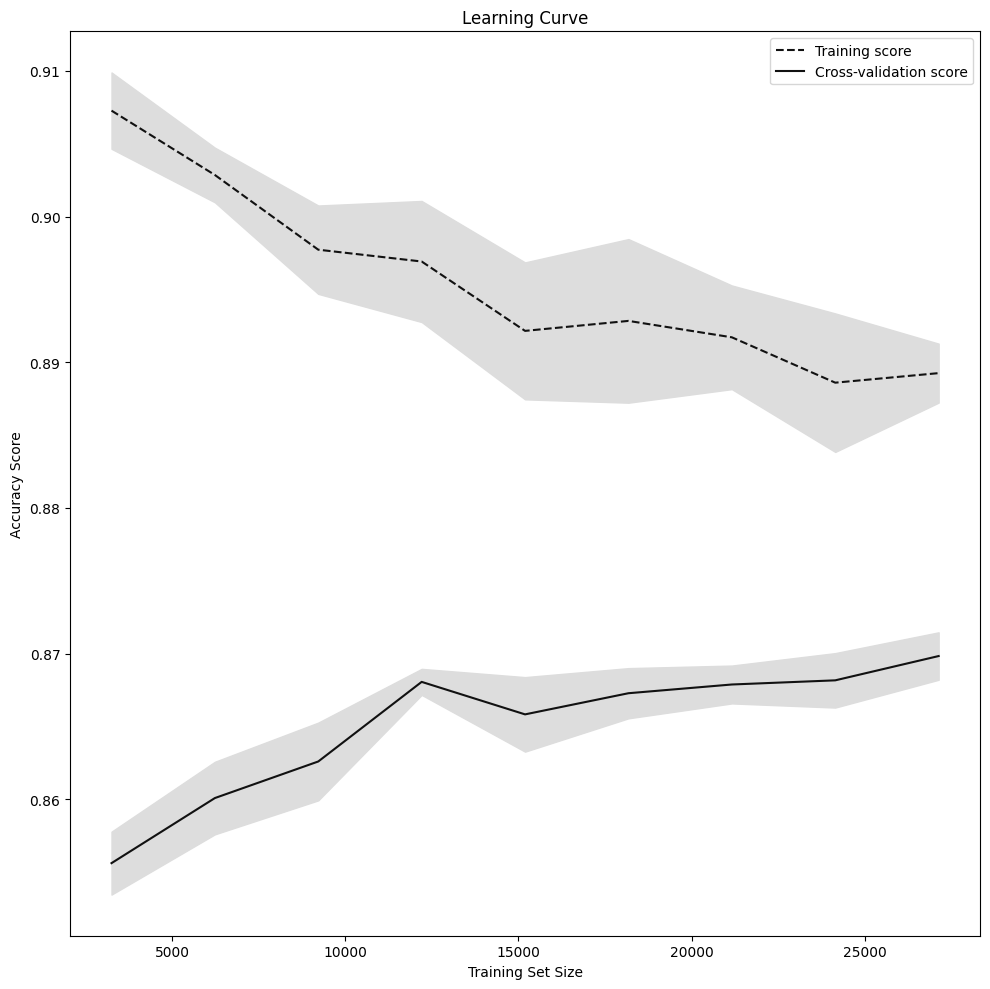

In [57]:
import matplotlib.pyplot as plt

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)

test_mean = np.mean(validation_scores, axis=1)
test_std = np.std(validation_scores, axis=1)

plt.subplots(1, figsize=(10,10))
plt.plot(train_sizes, train_mean, '--', color="#111111",  label="Training score")
plt.plot(train_sizes, test_mean, color="#111111", label="Cross-validation score")

plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color="#DDDDDD")
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color="#DDDDDD")

plt.title("Learning Curve")
plt.xlabel("Training Set Size"), plt.ylabel("Accuracy Score"), plt.legend(loc="best")
plt.tight_layout()
plt.show()

In [60]:
#apply regularization and finalize this model
# feature cross of pdays & previous
# binned balance 
# feature cross of month and day_of_week

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline age & day_of_week & balancce binned and feature cross of pdays and previous and month day_of_week and regularization")

    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()
    #feature cross
    df_copy['pdays_previous_cross']= df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)
    df_copy['month_day_of_week_cross']= df_copy['month'].astype(str) + '_' + df_copy['day_of_week'].astype(str)


    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'],axis=1) 
      
    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'],axis=1,inplace=True) 

    #add balance binned column and drop balance column
    df_copy['balance_binned'] = pd.cut(df['balance'], bins=10).astype(str)
    df_copy.drop(['balance'],axis=1,inplace=True) 


    #recreate training and testing data split
    X = df_copy.drop(['y'],axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)      

    #train catboost and get the cross validation score
    cat = CatBoostClassifier(random_state=123,
                             cat_features=list(X.select_dtypes(include='object').columns),
                             l2_leaf_reg=3.0)
    cat_pipeline=Pipeline([('catboost',cat)])
    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    cat_pipeline['catboost'].get_feature_importance(prettified=True)



0:	learn: 0.6678804	total: 55.8ms	remaining: 55.8s
1:	learn: 0.6446536	total: 87.6ms	remaining: 43.7s
2:	learn: 0.6225844	total: 116ms	remaining: 38.5s
3:	learn: 0.6017062	total: 148ms	remaining: 36.8s
4:	learn: 0.5834071	total: 162ms	remaining: 32.2s
5:	learn: 0.5636807	total: 193ms	remaining: 32s
6:	learn: 0.5461444	total: 225ms	remaining: 32s
7:	learn: 0.5316949	total: 241ms	remaining: 29.9s
8:	learn: 0.5176809	total: 260ms	remaining: 28.6s
9:	learn: 0.5050611	total: 317ms	remaining: 31.4s
10:	learn: 0.4926782	total: 340ms	remaining: 30.5s
11:	learn: 0.4815701	total: 366ms	remaining: 30.1s
12:	learn: 0.4709016	total: 393ms	remaining: 29.9s
13:	learn: 0.4600373	total: 423ms	remaining: 29.8s
14:	learn: 0.4497059	total: 447ms	remaining: 29.4s
15:	learn: 0.4401341	total: 470ms	remaining: 28.9s
16:	learn: 0.4302079	total: 497ms	remaining: 28.7s
17:	learn: 0.4218706	total: 523ms	remaining: 28.5s
18:	learn: 0.4144733	total: 543ms	remaining: 28s
19:	learn: 0.4074487	total: 565ms	remaining: 

2024/09/09 23:13:58 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/09 23:13:58 INFO mlflow.tracking._tracking_service.client: 🏃 View run selective-lark-586 at: http://127.0.0.1:5000/#/experiments/1/runs/41f67bab9b7347beacdc6d1ab07e9fcc.
2024/09/09 23:13:58 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/41f67bab9b7347beacdc6d1ab07e9fcc/artifacts'


In [61]:
cat_scores.mean()

0.8696483271926786

In [62]:
train_sizes, train_scores, validation_scores = learning_curve(
estimator = cat_pipeline['catboost'],
X = X_train,
y = y_train, 
n_jobs=-1, train_sizes=np.linspace(0.01, 1.0, 10), 
cv = 5, scoring = 'f1_weighted')

0:	learn: 0.6686956	total: 74ms	remaining: 1m 13s
1:	learn: 0.6453375	total: 96.2ms	remaining: 48s
2:	learn: 0.6241174	total: 117ms	remaining: 39s
3:	learn: 0.6044144	total: 140ms	remaining: 34.9s
4:	learn: 0.5848917	total: 160ms	remaining: 31.8s
5:	learn: 0.5683525	total: 169ms	remaining: 28s
6:	learn: 0.5523031	total: 192ms	remaining: 27.2s
7:	learn: 0.5375952	total: 223ms	remaining: 27.6s
0:	learn: 0.6702241	total: 97.3ms	remaining: 1m 37s
8:	learn: 0.5234395	total: 234ms	remaining: 25.7s
1:	learn: 0.6494840	total: 110ms	remaining: 54.7s
9:	learn: 0.5103908	total: 254ms	remaining: 25.1s
2:	learn: 0.6301568	total: 130ms	remaining: 43.3s
10:	learn: 0.4976416	total: 282ms	remaining: 25.4s
3:	learn: 0.6096590	total: 171ms	remaining: 42.5s
11:	learn: 0.4864940	total: 300ms	remaining: 24.7s
12:	learn: 0.4751190	total: 322ms	remaining: 24.4s
4:	learn: 0.5895282	total: 206ms	remaining: 40.9s
5:	learn: 0.5741183	total: 221ms	remaining: 36.6s
6:	learn: 0.5571001	total: 245ms	remaining: 34.8s


/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
1 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/catboost/core.py", line 5245, in fit
    self._fit(X, y, cat_features, text_features, embe

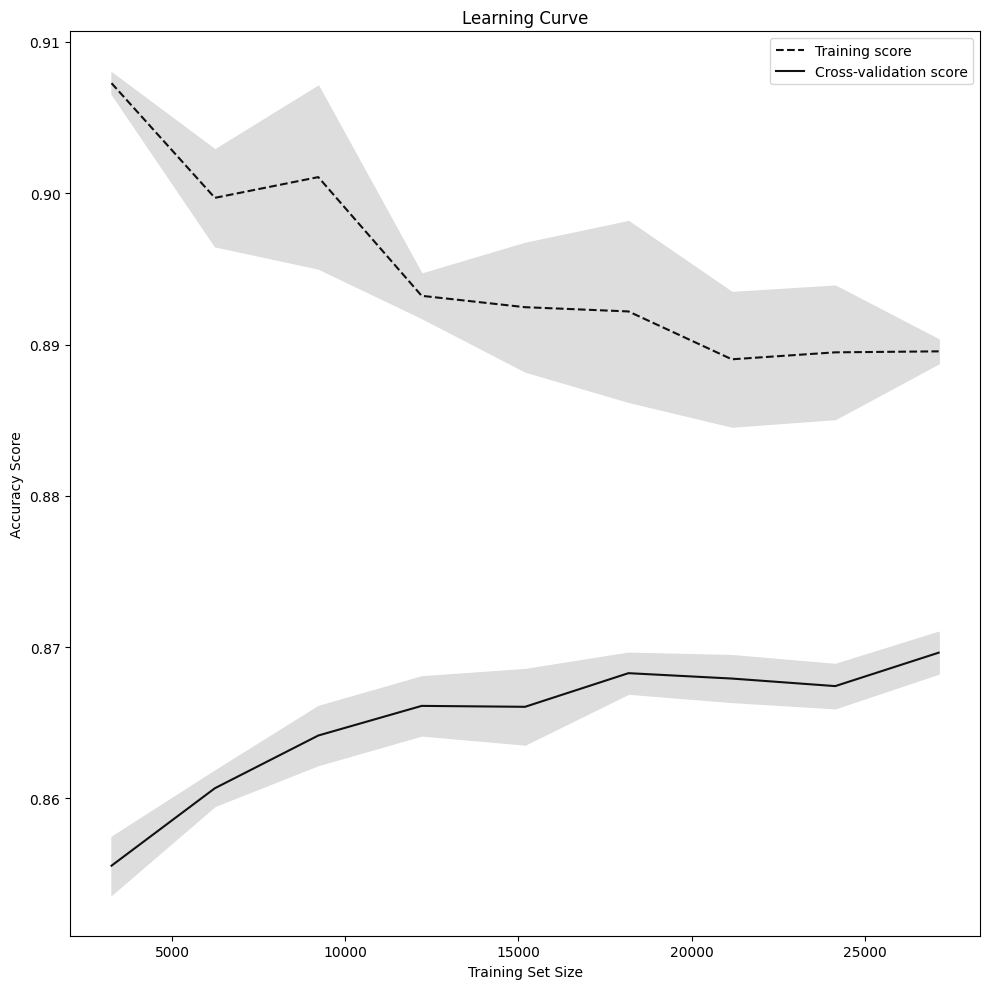

In [63]:
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)

test_mean = np.mean(validation_scores, axis=1)
test_std = np.std(validation_scores, axis=1)

plt.subplots(1, figsize=(10,10))
plt.plot(train_sizes, train_mean, '--', color="#111111",  label="Training score")
plt.plot(train_sizes, test_mean, color="#111111", label="Cross-validation score")

plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color="#DDDDDD")
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color="#DDDDDD")

plt.title("Learning Curve")
plt.xlabel("Training Set Size"), plt.ylabel("Accuracy Score"), plt.legend(loc="best")
plt.tight_layout()
plt.show()

## Hyperparameter Tuning for finalized model

In [14]:
from skopt import BayesSearchCV
from skopt.space import Real, Integer

#define hyperparameter search space
param_space = {
    'catboost__depth': Integer(4, 8),
    'catboost__learning_rate': Real(0.01, 0.3, prior='log-uniform'),
    'catboost__iterations': Integer(100, 300),
    'catboost__l2_leaf_reg': Real(1.0, 5.0, prior='log-uniform')
}

#limiting iterations for the bayes search to keep it efficient
n_iter_search = 25

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline with Bayesian optimization and feature engineering")
    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()

    # Feature cross
    df_copy['pdays_previous_cross'] = df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)
    df_copy['month_day_of_week_cross'] = df_copy['month'].astype(str) + '_' + df_copy['day_of_week'].astype(str)

    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'], axis=1)

    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'], axis=1, inplace=True)

    #add balance binned column and drop balance column
    df_copy['balance_binned'] = pd.cut(df['balance'], bins=10).astype(str)
    df_copy.drop(['balance'], axis=1, inplace=True)

    #recreate train and test data split
    X = df_copy.drop(['y'], axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

    cat = CatBoostClassifier(random_state=123, cat_features=list(X.select_dtypes(include='object').columns))

    cat_pipeline = Pipeline([('catboost', cat)])

    #hyperparameter tuning with BayesSearchCV
    bayes_search = BayesSearchCV(
        estimator=cat_pipeline,
        search_spaces=param_space,
        n_iter=n_iter_search,
        cv=3,
        scoring='f1_weighted',
        random_state=42
    )
    bayes_search.fit(X_train, y_train)

    #log best hyperparameters
    mlflow.log_params(bayes_search.best_params_)
    

    best_model = bayes_search.best_estimator_
    best_model.fit(X_train, y_train)
    best_cv_score = bayes_search.best_score_
    print(f"Best CV f1_weighted: {best_cv_score:.3f}")

    #logging
    mlflow.log_metric("f1_weighted", best_cv_score)
    mlflow.sklearn.log_model(best_model, artifact_path="models")
    feature_importance = best_model['catboost'].get_feature_importance(prettified=True)
    mlflow.log_text(str(feature_importance), 'feature_importance.txt')

    print(f"Default artifacts URI: '{mlflow.get_artifact_uri()}'")


0:	learn: 0.6684934	total: 78ms	remaining: 19.1s
1:	learn: 0.6457789	total: 92.9ms	remaining: 11.3s
2:	learn: 0.6241594	total: 110ms	remaining: 8.9s
3:	learn: 0.6036767	total: 128ms	remaining: 7.77s
4:	learn: 0.5856774	total: 144ms	remaining: 6.93s
5:	learn: 0.5662560	total: 163ms	remaining: 6.53s
6:	learn: 0.5489505	total: 181ms	remaining: 6.19s
7:	learn: 0.5346544	total: 190ms	remaining: 5.64s
8:	learn: 0.5207712	total: 198ms	remaining: 5.22s
9:	learn: 0.5069699	total: 213ms	remaining: 5.03s
10:	learn: 0.4932226	total: 229ms	remaining: 4.89s
11:	learn: 0.4813245	total: 247ms	remaining: 4.82s
12:	learn: 0.4698284	total: 269ms	remaining: 4.82s
13:	learn: 0.4594992	total: 290ms	remaining: 4.8s
14:	learn: 0.4493691	total: 314ms	remaining: 4.84s
15:	learn: 0.4395425	total: 363ms	remaining: 5.21s
16:	learn: 0.4307379	total: 388ms	remaining: 5.22s
17:	learn: 0.4227435	total: 404ms	remaining: 5.11s
18:	learn: 0.4152273	total: 424ms	remaining: 5.07s
19:	learn: 0.4078325	total: 450ms	remaining

2024/09/10 20:13:38 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/10 20:13:38 INFO mlflow.tracking._tracking_service.client: 🏃 View run dashing-dog-705 at: http://127.0.0.1:5000/#/experiments/1/runs/a3cabd1f4cc6434a81762deef514f951.
2024/09/10 20:13:38 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


Default artifacts URI: 'mlflow-artifacts:/1/a3cabd1f4cc6434a81762deef514f951/artifacts'


In [17]:
import numpy as np

In [18]:
## Plotting learning curve to check that the best model didn't overfit

train_sizes, train_scores, validation_scores = learning_curve(
estimator = best_model['catboost'],
X = X_train,
y = y_train, 
n_jobs=-1, train_sizes=np.linspace(0.01, 1.0, 10), 
cv = 5, scoring = 'f1_weighted')

0:	learn: 0.5662347	total: 97ms	remaining: 27.5s
0:	learn: 0.5738756	total: 112ms	remaining: 31.7s
1:	learn: 0.4788486	total: 125ms	remaining: 17.7s
2:	learn: 0.4286508	total: 165ms	remaining: 15.4s
3:	learn: 0.3857868	total: 183ms	remaining: 12.8s
0:	learn: 0.5593637	total: 124ms	remaining: 35.1s
1:	learn: 0.4908269	total: 210ms	remaining: 29.6s
4:	learn: 0.3610788	total: 243ms	remaining: 13.5s
5:	learn: 0.3358323	total: 263ms	remaining: 12.2s
1:	learn: 0.4865368	total: 221ms	remaining: 31.2s
2:	learn: 0.4381424	total: 279ms	remaining: 26.1s
6:	learn: 0.3193171	total: 314ms	remaining: 12.4s
3:	learn: 0.4034080	total: 316ms	remaining: 22.1s
7:	learn: 0.3094389	total: 338ms	remaining: 11.7s
2:	learn: 0.4292393	total: 301ms	remaining: 28.2s
3:	learn: 0.4006610	total: 315ms	remaining: 22.1s
8:	learn: 0.3010303	total: 402ms	remaining: 12.3s
0:	learn: 0.5597018	total: 181ms	remaining: 51.1s
4:	learn: 0.3726859	total: 420ms	remaining: 23.4s
4:	learn: 0.3742526	total: 382ms	remaining: 21.3s
9

/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
1 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/aasth/.local/share/virtualenvs/bank-marketing-campaign-L3RYENqv/lib/python3.11/site-packages/catboost/core.py", line 5245, in fit
    self._fit(X, y, cat_features, text_features, embe

In [20]:
import matplotlib.pyplot as plt

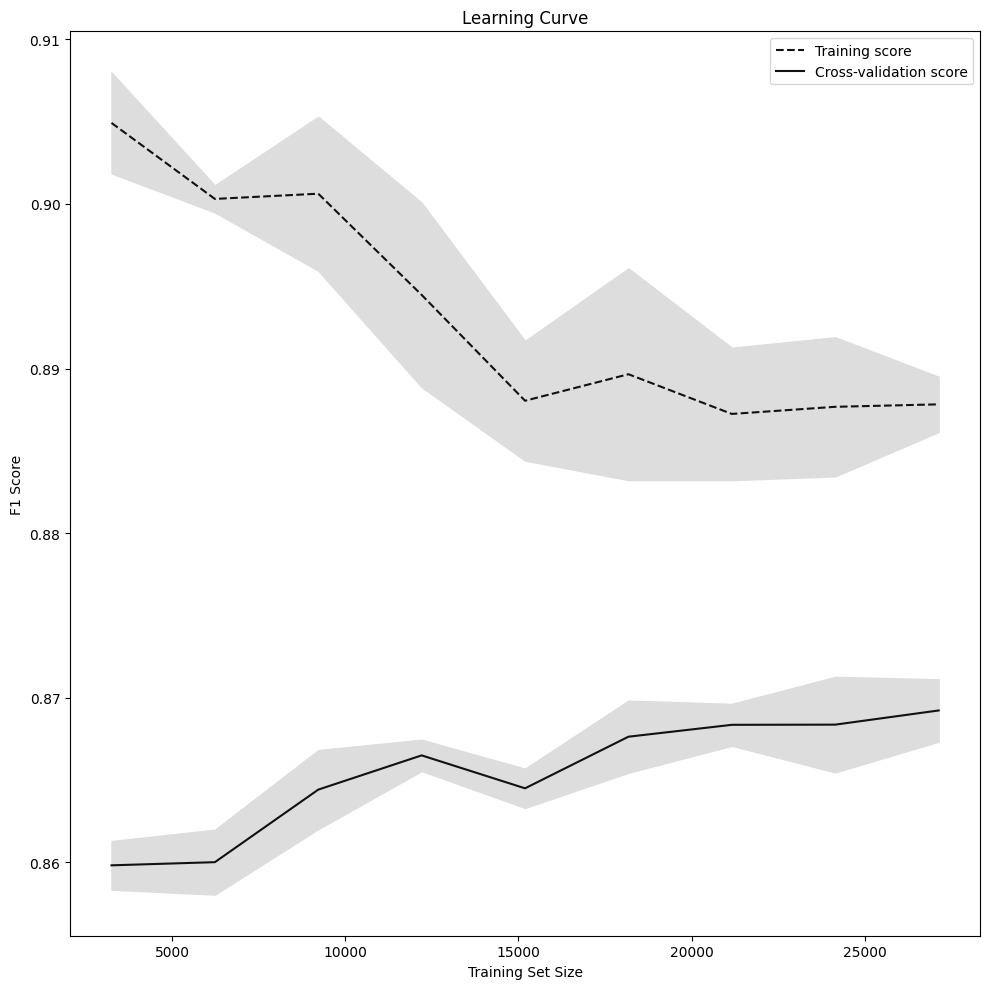

In [21]:
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)

test_mean = np.mean(validation_scores, axis=1)
test_std = np.std(validation_scores, axis=1)

plt.subplots(1, figsize=(10,10))
plt.plot(train_sizes, train_mean, '--', color="#111111",  label="Training score")
plt.plot(train_sizes, test_mean, color="#111111", label="Cross-validation score")

plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color="#DDDDDD")
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color="#DDDDDD")

plt.title("Learning Curve")
plt.xlabel("Training Set Size"), plt.ylabel("F1 Score"), plt.legend(loc="best")
plt.tight_layout()
plt.show()

### Try balancing classes

1. Class weights

In [23]:
#remove 'catboost__' prefix from best_params_
cleaned_best_params = {key.split('__')[-1]: value for key, value in bayes_search.best_params_.items()}

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline with Bayesian optimization and feature engineering and class balancing")
    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()

    # Feature cross
    df_copy['pdays_previous_cross'] = df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)
    df_copy['month_day_of_week_cross'] = df_copy['month'].astype(str) + '_' + df_copy['day_of_week'].astype(str)

    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'], axis=1)

    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'], axis=1, inplace=True)

    #add balance binned column and drop balance column
    df_copy['balance_binned'] = pd.cut(df['balance'], bins=10).astype(str)
    df_copy.drop(['balance'], axis=1, inplace=True)

    #recreate train and test data split
    X = df_copy.drop(['y'], axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

    cat = CatBoostClassifier(random_state=123, cat_features=list(X.select_dtypes(include='object').columns),
    class_weights={0: 1, 1: 7.5},  # class imbalance
        **cleaned_best_params)

    cat_pipeline = Pipeline([('catboost', cat)])

    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    feature_importance = cat_pipeline['catboost'].get_feature_importance(prettified=True)
    mlflow.log_text(str(feature_importance), 'feature_importance.txt')

    print(f"Default artifacts URI: '{mlflow.get_artifact_uri()}'")


0:	learn: 0.6620684	total: 46.3ms	remaining: 13.1s
1:	learn: 0.6375327	total: 69.9ms	remaining: 9.86s
2:	learn: 0.6156574	total: 86.5ms	remaining: 8.1s
3:	learn: 0.6016665	total: 103ms	remaining: 7.22s
4:	learn: 0.5924755	total: 122ms	remaining: 6.79s
5:	learn: 0.5856596	total: 141ms	remaining: 6.53s
6:	learn: 0.5806240	total: 155ms	remaining: 6.13s
7:	learn: 0.5748615	total: 169ms	remaining: 5.84s
8:	learn: 0.5710479	total: 187ms	remaining: 5.72s
9:	learn: 0.5674904	total: 209ms	remaining: 5.72s
10:	learn: 0.5654020	total: 227ms	remaining: 5.64s
11:	learn: 0.5625933	total: 245ms	remaining: 5.56s
12:	learn: 0.5608952	total: 267ms	remaining: 5.57s
13:	learn: 0.5595639	total: 288ms	remaining: 5.56s
14:	learn: 0.5588917	total: 305ms	remaining: 5.47s
15:	learn: 0.5569490	total: 323ms	remaining: 5.42s
16:	learn: 0.5553174	total: 342ms	remaining: 5.38s
17:	learn: 0.5541893	total: 359ms	remaining: 5.31s
18:	learn: 0.5524243	total: 376ms	remaining: 5.24s
19:	learn: 0.5514970	total: 393ms	remai

2024/09/10 21:27:50 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/10 21:27:51 INFO mlflow.tracking._tracking_service.client: 🏃 View run debonair-auk-951 at: http://127.0.0.1:5000/#/experiments/1/runs/5a268e4bf9454a698171118bf4a5532b.
2024/09/10 21:27:51 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/5a268e4bf9454a698171118bf4a5532b/artifacts'
Default artifacts URI: 'mlflow-artifacts:/1/5a268e4bf9454a698171118bf4a5532b/artifacts'


2. Oversampling

In [27]:
#remove 'catboost__' prefix from best_params_
cleaned_best_params = {key.split('__')[-1]: value for key, value in bayes_search.best_params_.items()}

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline with Bayesian optimization and feature engineering and oversampling")
    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()

    # Feature cross
    df_copy['pdays_previous_cross'] = df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)
    df_copy['month_day_of_week_cross'] = df_copy['month'].astype(str) + '_' + df_copy['day_of_week'].astype(str)

    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'], axis=1)

    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'], axis=1, inplace=True)

    #add balance binned column and drop balance column
    df_copy['balance_binned'] = pd.cut(df['balance'], bins=10).astype(str)
    df_copy.drop(['balance'], axis=1, inplace=True)

    #recreate train and test data split
    X = df_copy.drop(['y'], axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

    oversampling_pipeline = ImbPipeline([
        ('sampler', RandomOverSampler(random_state=42)),
        ('catboost',CatBoostClassifier(
                random_state=123,
                cat_features=list(X.select_dtypes(include='object').columns),
                **cleaned_best_params
            )
        )
    ])    

    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    feature_importance = cat_pipeline['catboost'].get_feature_importance(prettified=True)
    mlflow.log_text(str(feature_importance), 'feature_importance.txt')

    print(f"Default artifacts URI: '{mlflow.get_artifact_uri()}'")


0:	learn: 0.6620684	total: 47ms	remaining: 13.3s
1:	learn: 0.6375327	total: 69.7ms	remaining: 9.83s
2:	learn: 0.6156574	total: 91ms	remaining: 8.52s
3:	learn: 0.6016665	total: 113ms	remaining: 7.88s
4:	learn: 0.5924755	total: 133ms	remaining: 7.43s
5:	learn: 0.5856596	total: 152ms	remaining: 7.03s
6:	learn: 0.5806240	total: 168ms	remaining: 6.65s
7:	learn: 0.5748615	total: 187ms	remaining: 6.44s
8:	learn: 0.5710479	total: 205ms	remaining: 6.26s
9:	learn: 0.5674904	total: 226ms	remaining: 6.19s
10:	learn: 0.5654020	total: 245ms	remaining: 6.07s
11:	learn: 0.5625933	total: 268ms	remaining: 6.06s
12:	learn: 0.5608952	total: 307ms	remaining: 6.4s
13:	learn: 0.5595639	total: 345ms	remaining: 6.64s
14:	learn: 0.5588917	total: 403ms	remaining: 7.23s
15:	learn: 0.5569490	total: 445ms	remaining: 7.46s
16:	learn: 0.5553174	total: 493ms	remaining: 7.74s
17:	learn: 0.5541893	total: 540ms	remaining: 7.98s
18:	learn: 0.5524243	total: 573ms	remaining: 8s
19:	learn: 0.5514970	total: 602ms	remaining: 7

2024/09/10 21:51:30 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/10 21:51:30 INFO mlflow.tracking._tracking_service.client: 🏃 View run rogue-bass-135 at: http://127.0.0.1:5000/#/experiments/1/runs/2ee0231dfaa440668d809f910ca5901b.
2024/09/10 21:51:30 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/2ee0231dfaa440668d809f910ca5901b/artifacts'
Default artifacts URI: 'mlflow-artifacts:/1/2ee0231dfaa440668d809f910ca5901b/artifacts'


3. Undersampling

In [28]:
#remove 'catboost__' prefix from best_params_
cleaned_best_params = {key.split('__')[-1]: value for key, value in bayes_search.best_params_.items()}

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline

with mlflow.start_run():

    mlflow.set_tag("model", "Catboost Pipeline with Bayesian optimization and feature engineering and undersampling")
    mlflow.log_param("train-data-path", "https://archive.ics.uci.edu/dataset/222/bank+marketing") 

    df_copy = df.copy()

    # Feature cross
    df_copy['pdays_previous_cross'] = df_copy['pdays'].astype(str) + '_' + df_copy['previous'].astype(str)
    df_copy['month_day_of_week_cross'] = df_copy['month'].astype(str) + '_' + df_copy['day_of_week'].astype(str)

    #add age binned column and drop age column
    df_copy['age_binned'] = pd.cut(df['age'], bins=10).astype(str)
    df_copy = df_copy.drop(['age'], axis=1)

    #add day_of_week binned column and drop day_of_week column
    df_copy['day_of_week_binned'] = pd.cut(df['day_of_week'], bins=10).astype(str)
    df_copy.drop(['day_of_week'], axis=1, inplace=True)

    #add balance binned column and drop balance column
    df_copy['balance_binned'] = pd.cut(df['balance'], bins=10).astype(str)
    df_copy.drop(['balance'], axis=1, inplace=True)

    #recreate train and test data split
    X = df_copy.drop(['y'], axis=1)
    y = df_copy['y']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

    oversampling_pipeline = ImbPipeline([
        ('sampler', RandomUnderSampler(random_state=42)),
        ('catboost',CatBoostClassifier(
                random_state=123,
                cat_features=list(X.select_dtypes(include='object').columns),
                **cleaned_best_params
            )
        )
    ])    

    cat_scores=cross_val_score(cat_pipeline,X_train,y_train,cv=3,scoring='f1_weighted',verbose=False)
    print("3-fold cross validation weighted f1 score:{:.3f}".format(cat_scores.mean()))
    cat_pipeline.fit(X_train,y_train,catboost__verbose=False) 

    #logging metrics
    mlflow.log_metric("f1_weighted", cat_scores.mean())
    mlflow.sklearn.log_model(cat_pipeline, artifact_path="models")
    print(f"default artifacts URI: '{mlflow.get_artifact_uri()}'")  

    feature_importance = cat_pipeline['catboost'].get_feature_importance(prettified=True)
    mlflow.log_text(str(feature_importance), 'feature_importance.txt')

    print(f"Default artifacts URI: '{mlflow.get_artifact_uri()}'")


0:	learn: 0.6620684	total: 29ms	remaining: 8.2s
1:	learn: 0.6375327	total: 47.5ms	remaining: 6.7s
2:	learn: 0.6156574	total: 64.3ms	remaining: 6.02s
3:	learn: 0.6016665	total: 82.1ms	remaining: 5.75s
4:	learn: 0.5924755	total: 100ms	remaining: 5.61s
5:	learn: 0.5856596	total: 117ms	remaining: 5.41s
6:	learn: 0.5806240	total: 132ms	remaining: 5.21s
7:	learn: 0.5748615	total: 148ms	remaining: 5.09s
8:	learn: 0.5710479	total: 172ms	remaining: 5.24s
9:	learn: 0.5674904	total: 195ms	remaining: 5.35s
10:	learn: 0.5654020	total: 216ms	remaining: 5.36s
11:	learn: 0.5625933	total: 235ms	remaining: 5.32s
12:	learn: 0.5608952	total: 260ms	remaining: 5.42s
13:	learn: 0.5595639	total: 304ms	remaining: 5.86s
14:	learn: 0.5588917	total: 347ms	remaining: 6.23s
15:	learn: 0.5569490	total: 382ms	remaining: 6.4s
16:	learn: 0.5553174	total: 427ms	remaining: 6.7s
17:	learn: 0.5541893	total: 467ms	remaining: 6.9s
18:	learn: 0.5524243	total: 501ms	remaining: 6.99s
19:	learn: 0.5514970	total: 530ms	remaining:

2024/09/10 21:52:02 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/09/10 21:52:02 INFO mlflow.tracking._tracking_service.client: 🏃 View run indecisive-roo-493 at: http://127.0.0.1:5000/#/experiments/1/runs/c8bde3f5fb1c45afb6429b6511e102df.
2024/09/10 21:52:02 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5000/#/experiments/1.


default artifacts URI: 'mlflow-artifacts:/1/c8bde3f5fb1c45afb6429b6511e102df/artifacts'
Default artifacts URI: 'mlflow-artifacts:/1/c8bde3f5fb1c45afb6429b6511e102df/artifacts'


Balancing classes didn't improve the score so we'll finalize the hyperparameter tuned model and move it to staging.

## Moving model to staging

In [29]:
best_model['catboost']

In [38]:
from mlflow.tracking import MlflowClient

client = MlflowClient("http://127.0.0.1:5000")
runs = client.search_runs(experiment_ids='1',order_by=["metrics.f1_weighted DESC"])

In [41]:
for run in runs:
    try:
        print(f"run id: {run.info.run_id}, model name: {run.data.tags['model']},"+
            f"f1 score: {run.data.metrics['f1_weighted']:.4f}, duration(s): {(run.info.end_time-run.info.start_time)/1000:.2f}")
    except:
        print("")

run id: a3cabd1f4cc6434a81762deef514f951, model name: Catboost Pipeline with Bayesian optimization and feature engineering,f1 score: 0.8708, duration(s): 361.83
run id: 580b73103dd143949bbc28a87bd91949, model name: Catboost Pipeline age & day_of_week & balancce binned and feature cross of pdays and previous and month day_of_week,f1 score: 0.8698, duration(s): 94.86
run id: 41f67bab9b7347beacdc6d1ab07e9fcc, model name: Catboost Pipeline age & day_of_week & balancce binned and feature cross of pdays and previous and month day_of_week and regularization,f1 score: 0.8696, duration(s): 107.38
run id: 44e8b3d34a544a9fa055ba6d23187f6c, model name: Catboost Pipeline age & day_of_week binned and feature cross of pdays and previous and month day_of_week,f1 score: 0.8694, duration(s): 99.97
run id: 758c01de43594372b16c2ba79550b567, model name: Catboost Pipeline age & day_of_week binned and feature cross of pdays and previous,f1 score: 0.8692, duration(s): 87.41
run id: b7486d4625b447c3b3108302ccb

In [42]:
run_id = "a3cabd1f4cc6434a81762deef514f951"
mlflow.register_model(
    model_uri=f"runs:/{run_id}/models",
    name='bank-classifier'
)

Successfully registered model 'bank-classifier'.
2024/09/10 22:07:27 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: bank-classifier, version 1
Created version '1' of model 'bank-classifier'.


<ModelVersion: aliases=[], creation_timestamp=1726031247663, current_stage='None', description='', last_updated_timestamp=1726031247663, name='bank-classifier', run_id='a3cabd1f4cc6434a81762deef514f951', run_link='', source='mlflow-artifacts:/1/a3cabd1f4cc6434a81762deef514f951/artifacts/models', status='READY', status_message='', tags={}, user_id='', version='1'>

In [43]:
model_name = "bank-classifier"
latest_versions = client.get_latest_versions(name=model_name)

for version in latest_versions:
    print(f"version: {version.version}, stage: {version.current_stage}")

version: 1, stage: None


/var/folders/jm/jkj24z8n52sdr5w8dvb59kvc0000gp/T/ipykernel_91280/2038122002.py:2: FutureWarning: ``mlflow.tracking.client.MlflowClient.get_latest_versions`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/latest/model-registry.html#migrating-from-stages
  latest_versions = client.get_latest_versions(name=model_name)


In [44]:
#moving model to staging
model_version = 1
new_stage = "Staging"
client.transition_model_version_stage(
    name=model_name,
    version=model_version,
    stage=new_stage,
    archive_existing_versions=False
)

/var/folders/jm/jkj24z8n52sdr5w8dvb59kvc0000gp/T/ipykernel_91280/692680833.py:4: FutureWarning: ``mlflow.tracking.client.MlflowClient.transition_model_version_stage`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/latest/model-registry.html#migrating-from-stages
  client.transition_model_version_stage(


<ModelVersion: aliases=[], creation_timestamp=1726031247663, current_stage='Staging', description='', last_updated_timestamp=1726031270771, name='bank-classifier', run_id='a3cabd1f4cc6434a81762deef514f951', run_link='', source='mlflow-artifacts:/1/a3cabd1f4cc6434a81762deef514f951/artifacts/models', status='READY', status_message='', tags={}, user_id='', version='1'>

In [45]:
client.transition_model_version_stage(
    name=model_name,
    version=1,
    stage="Production",
    archive_existing_versions=True
)

/var/folders/jm/jkj24z8n52sdr5w8dvb59kvc0000gp/T/ipykernel_91280/1316468422.py:1: FutureWarning: ``mlflow.tracking.client.MlflowClient.transition_model_version_stage`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/latest/model-registry.html#migrating-from-stages
  client.transition_model_version_stage(


<ModelVersion: aliases=[], creation_timestamp=1726031247663, current_stage='Production', description='', last_updated_timestamp=1726031345868, name='bank-classifier', run_id='a3cabd1f4cc6434a81762deef514f951', run_link='', source='mlflow-artifacts:/1/a3cabd1f4cc6434a81762deef514f951/artifacts/models', status='READY', status_message='', tags={}, user_id='', version='1'>

## Predicting the target on X_test

In [46]:
import mlflow
logged_model = 'runs:/a3cabd1f4cc6434a81762deef514f951/models'

# Load model as a PyFuncModel.
loaded_model = mlflow.pyfunc.load_model(logged_model)

# Predict on a Pandas DataFrame.
import pandas as pd

y_pred = loaded_model.predict(X_test)